In [ ]:
pip install https://github.com/stefanloock/pyshearlab/archive/master.zip

     - 99.8 kB 1.3 MB/s 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyshearlab: filename=pyshearlab-0.0.1-py3-none-any.whl size=36593 sha256=ebfcfbd4de762f7ed3104fe1fc354d66b28dc4fa7c856cdc191f22b60a30674e
  Stored in directory: /tmp/pip-ephem-wheel-cache-umdeary_/wheels/ce/15/63/5986e906af5b4f646f016792f1f40af639710d02869648624f
Successfully built pyshearlab


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math
import matplotlib
import pyshearlab
import scipy

In [ ]:
from IPython.display import display
from PIL import Image
import cv2

In [ ]:
def bump(t):
    if abs(t)<1:
        return (np.cos(np.pi*t/2))**2
    return 0

35x
4 − 84x
5 + 70x
6 − 20x
7

In [ ]:
def v(t):
    if t<0:
        return 0
    if t>1:
        return 1
    return 35*(t**4) - 84*(t**5) +70*(t**6) -20*(t**7)

In [ ]:
def meyer(t):
    if t<0:
        t=-t
    if abs(t)<=1/4 and abs(t)>1/8:
        return (1/np.sqrt(2*np.pi))*np.sin((np.pi/2)*v(8*(t)-1))
    elif abs(t)>1/4 and abs(t)<=1/2:
        return (1/np.sqrt(2*np.pi))*np.cos((np.pi/2)*v(4*t-1))
    else:
        return 0

In [ ]:
def shearlet(w):
    if w[1]==0:
        return 0
    return bump(w[0]/w[1])*meyer(w[1])

def vshearlet(w):
    if w[0]==0:
        return 0
    return bump(w[1]/w[0])*meyer(w[0])

In [ ]:
def Ainv(ja):
    return np.array([[2**(-ja/2),0],[0,2**(-ja)]])

def Sinv(l):
    return np.array([[1,0],[-l,1]])

def vAinv(ja):
    return np.array([[2**(-ja),0],[0,2**(-ja/2)]])

def vSinv(l):
    return np.array([[1,-l],[0,1]])

def co(ja,l,k,w):
    ans=np.matmul(Ainv(ja),Sinv(l))
    ans=np.matmul(ans,k)
    return 2**(-3*ja/4)*np.exp(-2*np.pi*1j*np.matmul(w,ans))

def matprod(ja,l,w):
    ans=np.matmul(Ainv(ja),Sinv(l))
    return 2**(-3*ja/4)*np.matmul(w,ans)

def vmatprod(ja,l,w):
    ans=np.matmul(vAinv(ja),vSinv(l))
    return 2**(-3*ja/4)*np.matmul(w,ans)

In [ ]:
path="/content/1_1.jpg"
path2="/content/1_4.jpg"
path3="/content/2_3.jpg"
path4="/content/p1.bmp"

In [ ]:
image=255-cv2.imread(path,cv2.IMREAD_GRAYSCALE)
image2=255-cv2.imread(path2,cv2.IMREAD_GRAYSCALE)
image3=255-cv2.imread(path3,cv2.IMREAD_GRAYSCALE)
image4=255-cv2.imread(path4,cv2.IMREAD_GRAYSCALE)

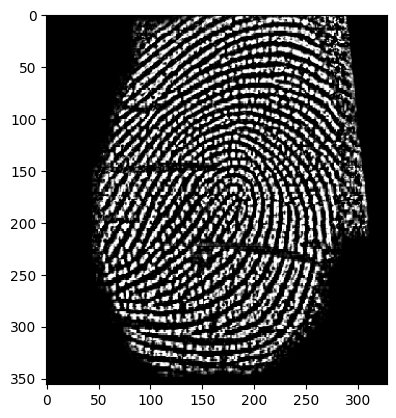

In [ ]:
plt.imshow(image,cmap="gray")

In [ ]:
fft_img=scipy.fft.fft2(image)
fft_img2=scipy.fft.fft2(image2)
fft_img3=scipy.fft.fft2(image3)
fft_img4=scipy.fft.fft2(image4)

In [ ]:
fft_img=scipy.fft.fftshift(fft_img)
fft_img2=scipy.fft.fftshift(fft_img2)
fft_img3=scipy.fft.fftshift(fft_img3)
fft_img4=scipy.fft.fftshift(fft_img4)

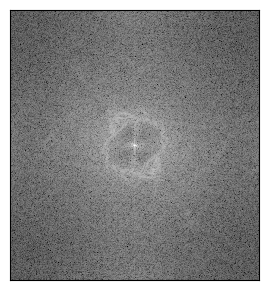

In [ ]:
fig = plt.figure(figsize=(12, 3))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(np.abs(np.log(fft_img)), interpolation="nearest",cmap=plt.cm.gray)
ax.set_xticks([])
ax.set_yticks([])

fig.tight_layout()
plt.show()

In [ ]:
newmask=np.zeros((int(fft_img.shape[0]),int(fft_img.shape[1])))

In [ ]:
xmid=fft_img.shape[0]/2
ymid=fft_img.shape[1]/2

In [ ]:
for i in range(len(newmask)):
    for j in range(len(newmask[i])):
        newmask[i][j]=shearlet([(i-xmid)*2*np.pi/fft_img.shape[0],(j-ymid)*2*np.pi/fft_img.shape[1]])

In [ ]:
newmask3=np.zeros((int(fft_img.shape[0]),int(fft_img.shape[1])))

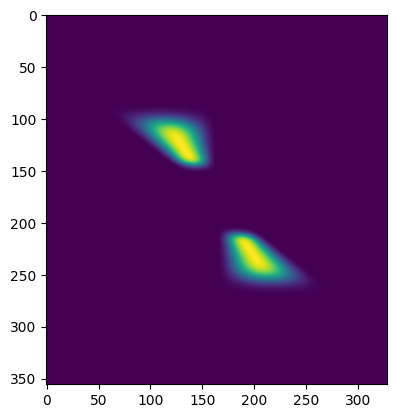

In [ ]:
for i in range(len(newmask3)):
    for j in range(len(newmask3[i])):
        newmask3[i][j]=vshearlet(vmatprod(1,1,[(i-xmid)*2*np.pi/fft_img.shape[0],(j-ymid)*2*np.pi/fft_img.shape[1]]))
plt.imshow(newmask3)

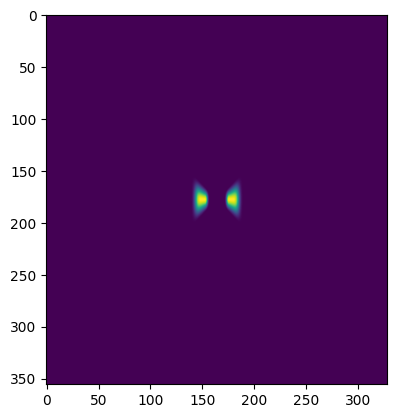

In [ ]:
plt.imshow(newmask)

In [ ]:
newfft3=newmask*fft_img

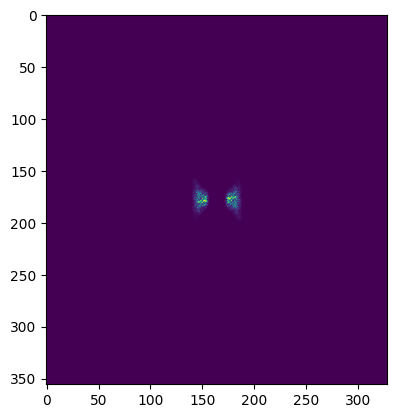

In [ ]:
plt.imshow(np.abs(newfft3))

In [ ]:

new3=scipy.fft.ifft2(scipy.fft.ifftshift(newfft3))

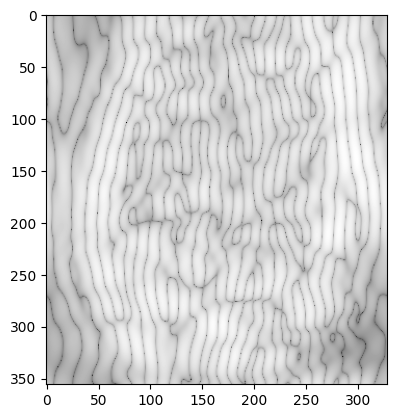

In [ ]:
plt.imshow(np.log(np.abs(new3)),cmap="gray")

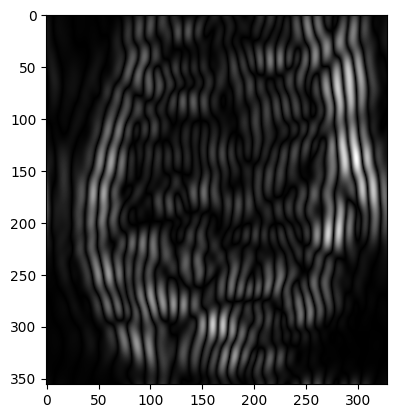

In [ ]:
plt.imshow((np.abs(new3)),cmap="gray")

In [ ]:
newmask2=np.zeros((int(fft_img.shape[0]),int(fft_img.shape[1])))

In [ ]:
for i in range(len(newmask2)):
    for j in range(len(newmask2[i])):
        if abs(i-xmid)<50 and abs(j-ymid)<50:
          newmask2[i][j]=1

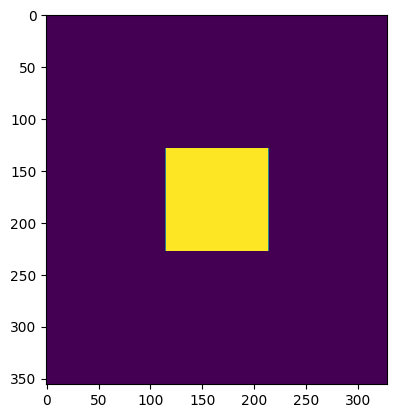

In [ ]:
plt.imshow(newmask2)

In [ ]:
newfft4=newmask2*fft_img

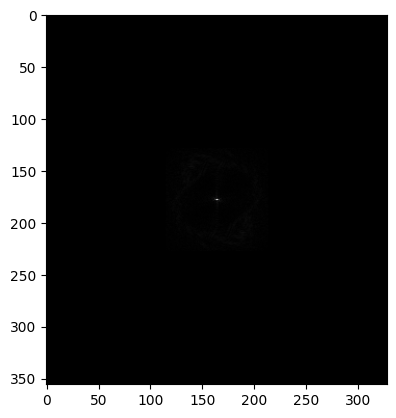

In [ ]:
plt.imshow(np.abs(newfft4),cmap="gray")

In [ ]:
newfft5=scipy.fft.ifftshift(newfft4)

<ipython-input-85-0d8c8af79fbe>:1: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.abs(newfft5)),cmap="gray")


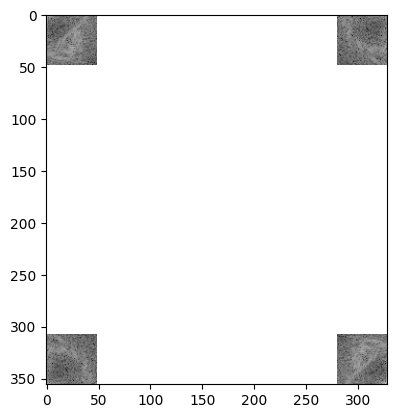

In [ ]:
plt.imshow(np.log(np.abs(newfft5)),cmap="gray")

In [ ]:
new5=scipy.fft.ifft2(newfft5)

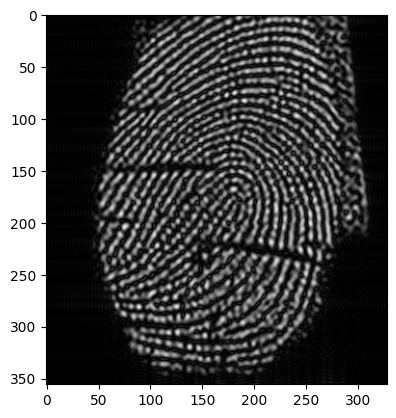

In [ ]:
plt.imshow(np.abs(new5),cmap="gray")

In [ ]:
img = 255-cv2.imread('1_1.jpg', cv2.IMREAD_GRAYSCALE)
filter = np.zeros_like(img, dtype='float')
filter[100:250, 100:250] = 1
img_filtered = scipy.fft.ifft2(scipy.fft.ifftshift(scipy.fft.fftshift(scipy.fft.fft2(img))*filter))

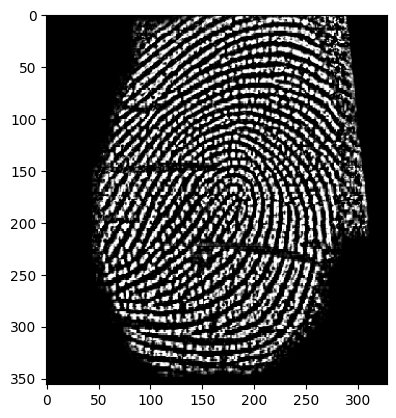

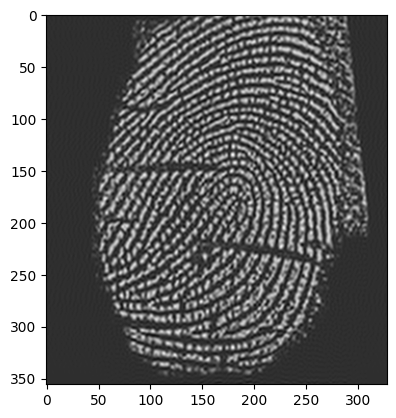

In [ ]:
plt.imshow(img, cmap='gray')
plt.show()

plt.imshow(img_filtered.real, cmap='gray')
plt.show()

In [ ]:
all_masks=[]
titles=[]

In [ ]:
for a in range(3):
  for l in range(int(-(2**(a/2))),int(math.ceil(2**(a/2)))):
    mask=np.zeros((int(fft_img.shape[0]),int(fft_img.shape[1])))
    mask2=np.zeros((int(fft_img.shape[0]),int(fft_img.shape[1])))
    for i in range(len(mask)):
      for j in range(len(mask[i])):
        mask[i][j]=shearlet(matprod(a,l,[(i-xmid)*2*np.pi/fft_img.shape[0],(j-ymid)*2*np.pi/fft_img.shape[1]]))
        mask2[i][j]=vshearlet(vmatprod(a,l,[(i-xmid)*2*np.pi/fft_img.shape[0],(j-ymid)*2*np.pi/fft_img.shape[1]]))
    all_masks.append(mask)
    all_masks.append(mask2)
    titles.append("j = "+str(a)+", s = "+str(l))
    titles.append("j = "+str(a)+", s = "+str(l))

In [ ]:
all_masks=np.array(all_masks)

In [ ]:
all_masks.shape

(18, 356, 328)

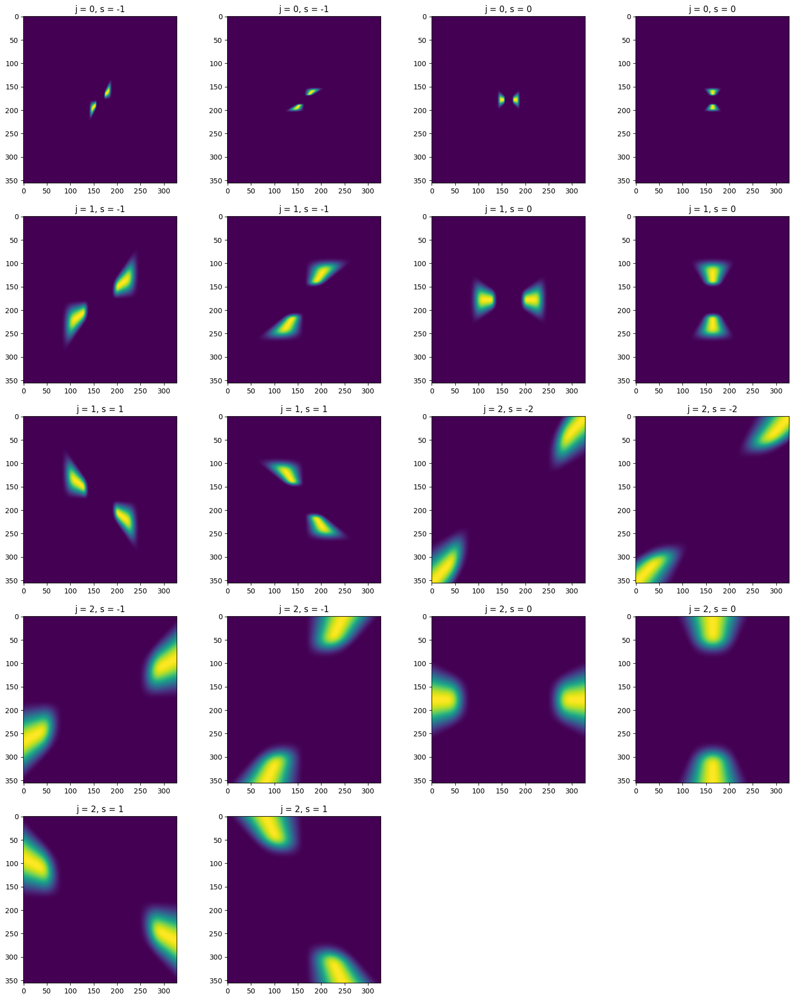

In [ ]:
plt.figure(figsize=(20,30))
for i in range(len(all_masks)):
  plt.subplot(6,4,i+1)
  plt.imshow(all_masks[i])
  plt.title(titles[i])

In [ ]:
def allfft(image,all_masks):
  all=all_masks*image
  all2=[]
  for i in range(len(all)):
    all2.append(scipy.fft.ifft2(scipy.fft.ifftshift(all[i])))
  return np.array(all2)

In [ ]:
all_reconst=allfft(fft_img,all_masks)

In [ ]:
len(all_reconst)

18

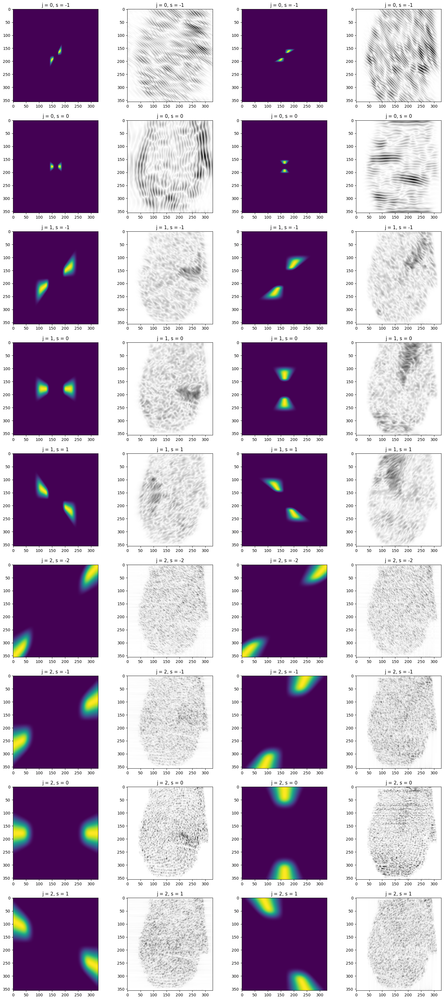

In [ ]:
plt.figure(figsize=(20,45))
for i in range(len(all_reconst)):
  plt.subplot(9,4,2*i+1)
  plt.imshow(all_masks[i])
  plt.title(titles[i])
  plt.subplot(9,4,2*i+2)
  plt.imshow(255-np.abs(all_reconst[i]),cmap='gray')
  plt.title(titles[i])

In [ ]:
all_reconst2=allfft(fft_img2,all_masks)


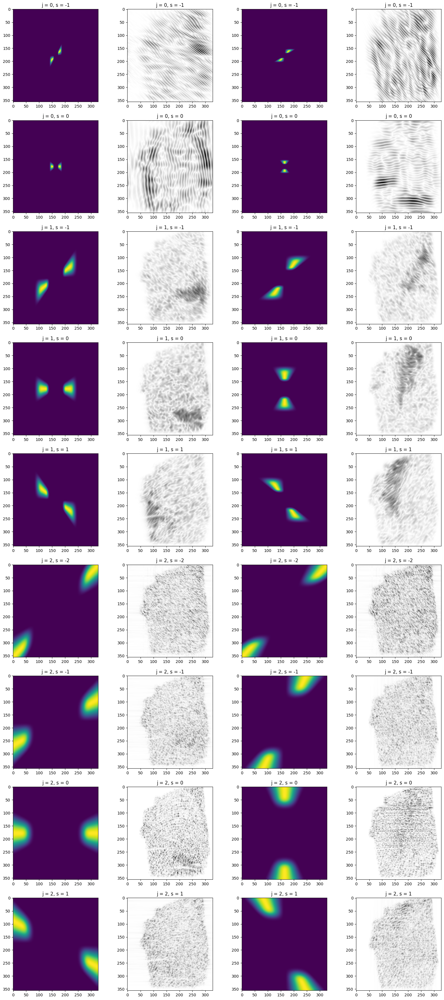

In [ ]:
plt.figure(figsize=(20,45))
for i in range(len(all_reconst2)):
  plt.subplot(9,4,2*i+1)
  plt.imshow(all_masks[i])
  plt.title(titles[i])
  plt.subplot(9,4,2*i+2)
  plt.imshow(255-np.abs(all_reconst2[i]),cmap='gray')
  plt.title(titles[i])

In [ ]:
all_reconst3=allfft(fft_img3,all_masks)

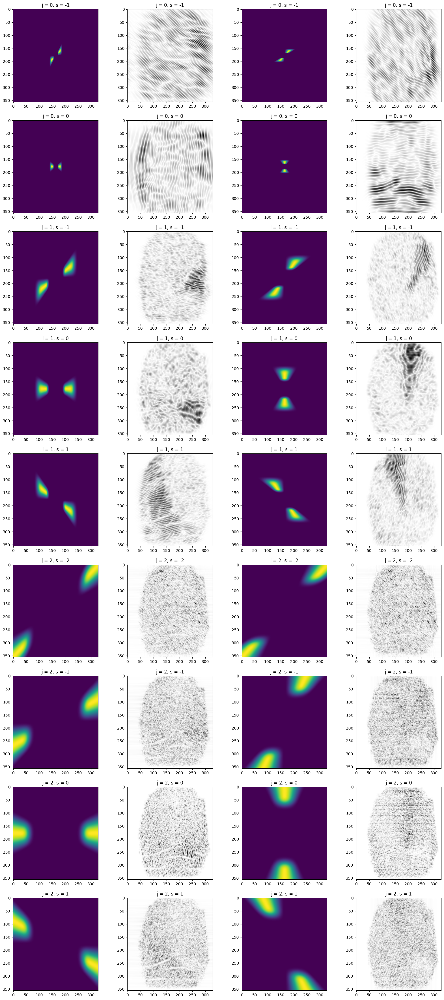

In [ ]:
plt.figure(figsize=(20,45))
for i in range(len(all_reconst3)):
  plt.subplot(9,4,2*i+1)
  plt.imshow(all_masks[i])
  plt.title(titles[i])
  plt.subplot(9,4,2*i+2)
  plt.imshow(255-np.abs(all_reconst3[i]),cmap='gray')
  plt.title(titles[i])

In [ ]:
xmid2=fft_img4.shape[0]/2
ymid2=fft_img4.shape[1]/2

In [ ]:
all_masks2=[]
titles2=[]
for a in range(3):
  for l in range(int(-(2**(a/2))),1+int(math.ceil(2**(a/2)))):
    mask=np.zeros((int(fft_img4.shape[0]),int(fft_img4.shape[1])))
    for i in range(len(mask)):
      for j in range(len(mask[i])):
        mask[i][j]=shearlet(matprod(a,l,[(i-xmid2)*2*np.pi/fft_img4.shape[0],(j-ymid2)*2*np.pi/fft_img4.shape[1]]))
    all_masks2.append(mask)
    titles2.append("j = "+str(a)+", s = "+str(l))

In [ ]:
all_reconst4=allfft(fft_img4,all_masks2)

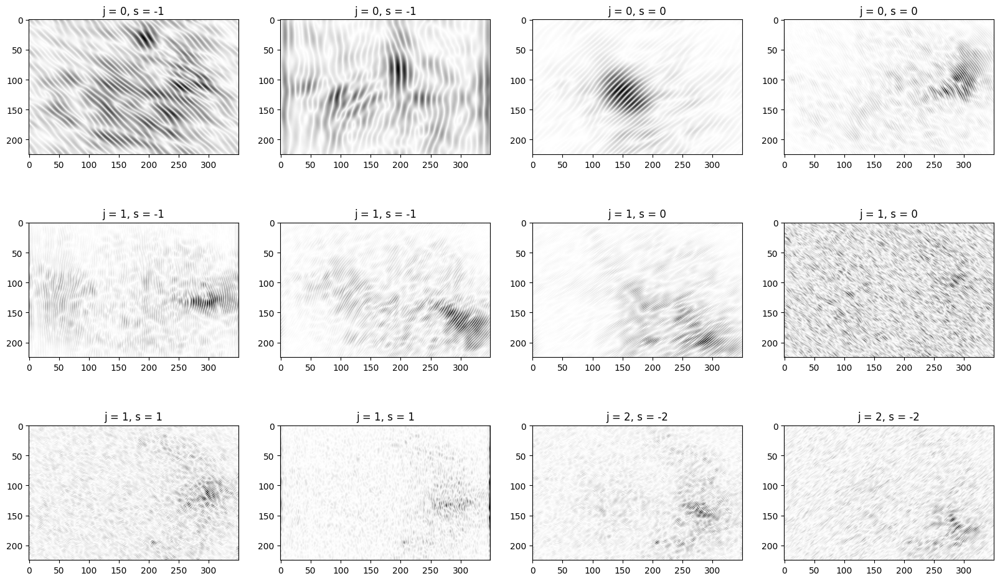

In [ ]:
plt.figure(figsize=(20,12))
for i in range(len(all_reconst4)):
  plt.subplot(3,4,i+1)
  plt.imshow(255-np.abs(all_reconst4[i]),cmap='gray')
  plt.title(titles[i])

In [ ]:
pip install fingerprint_enhancer

In [ ]:
from google.colab.patches import cv2_imshow

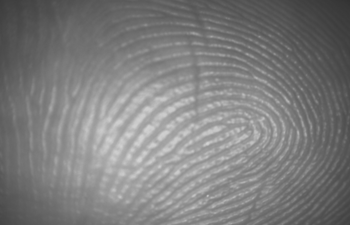

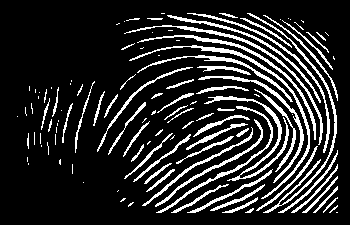

-1

In [ ]:
import fingerprint_enhancer					# Load the library
img = cv2.imread(path4, 0)						# read input image
cv2_imshow(img)
out = fingerprint_enhancer.enhance_Fingerprint(img)		# enhance the fingerprint image
cv2_imshow( out);						# display the result
cv2.waitKey(0)